# VAST Challenge 2017 (Mini-Challenge 1)

# Введение

TODO
* чуть про данные мб сказать или где про них почитать в репо

In [2]:
# !pip install pandas --quiet
# !pip install numpy --quiet
# !pip install seaborn --quiet
# !pip install  scikit-learn --quiet
# !pip install matplotlib --quiet
# !pip install plotly --quiet
# !pip install plotly jupyterlab --quiet
# !pip install networkx --quiet

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
import seaborn as sns
from sklearn.ensemble import IsolationForest
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from typing import Counter
from sgt import SGT
import re

pyo.init_notebook_mode()
%matplotlib inline

In [3]:
df = pd.read_csv("./data/sensors.csv", parse_dates=["Timestamp"])

In [4]:
df.columns = ["timestamp", "car_id", "car_type", "gate_name"]
df["car_type"] = df["car_type"].astype(str).str.strip()
df["gate_name"] = df["gate_name"].str.strip().str.lower()
df.sort_values(["car_id", "timestamp"], inplace=True)
df.reset_index(drop=True, inplace=True)

df["hour"] = df["timestamp"].dt.hour
df["dow"] = df["timestamp"].dt.dayofweek
df["dow_name"] = df["timestamp"].dt.day_name()
df["month"] = df["timestamp"].dt.month
df["date"] = df["timestamp"].dt.date
df["is_weekend"] = df["dow"].isin([5, 6])

In [5]:
SENSOR_TYPES = {
    "entrance": "Entrance",
    "general-gate": "General-Gate",
    "gate": "Gate (restricted)",
    "ranger-stop": "Ranger-Stop",
    "camping": "Camping",
}

def sensor_type(name):
    for prefix, stype in SENSOR_TYPES.items():
        if name.startswith(prefix):
            return stype
    return "Unknown"

df["sensor_type"] = df["gate_name"].apply(sensor_type)

df["visit_order"] = df.groupby("car_id").cumcount() + 1
df["prev_gate"] = df.groupby("car_id")["gate_name"].shift(1)
df["next_gate"] = df.groupby("car_id")["gate_name"].shift(-1)
df["time_since_prev"] = df.groupby("car_id")["timestamp"].diff()

In [6]:
grp = df.groupby("car_id")

# Статистика о каждой поездке
stats = pd.DataFrame({
    "car_id": grp.groups.keys(),
    "car_type": grp["car_type"].first(),
    "first_gate": grp["gate_name"].first(),
    "last_gate": grp["gate_name"].last(),
    "first_time": grp["timestamp"].min(),
    "last_time": grp["timestamp"].max(),
    "n_events": grp.size(),
    "n_unique_gates": grp["gate_name"].nunique(),
    "n_unique_sensors": grp["sensor_type"].nunique(),
    "visited_camping": grp["sensor_type"].apply(lambda x: "Camping" in x.values),
    "route": grp["gate_name"].agg(' '.join),
    
    "visited_ranger": grp["sensor_type"].apply(lambda x: "Ranger-Stop" in x.values),
    "visited_gate_restr": grp["sensor_type"].apply(lambda x: "Gate (restricted)" in x.values),

    "entry_hour": grp["timestamp"].min().dt.hour,
    "entry_dow": grp["timestamp"].min().dt.dayofweek,
    "exit_hour": grp["timestamp"].max().dt.hour,
    "exit_dow": grp["timestamp"].max().dt.dayofweek,
    "is_weekend": grp["is_weekend"].first(),
})
stats["duration_h"] = (stats["last_time"] - stats["first_time"]).dt.total_seconds() / 3600.0
stats["is_thrutraffic"] = (
    (~stats["visited_camping"]) &
    (stats["car_type"] != "2P") &
    (stats["duration_h"] < 2.0)
)
stats["is_ranger"] = stats["car_type"] == "2P"
stats["is_overnight"] = (stats["duration_h"] > 12) & stats["visited_camping"] & (stats["is_ranger"] != 1)

In [7]:
stats['route_type_csv'] = 'none'
stats.loc[stats['is_thrutraffic'], 'route_type_csv'] = 'transit'
stats.loc[stats['is_ranger'], 'route_type_csv'] = 'ranger'
stats.loc[stats['is_overnight'], 'route_type_csv'] = 'camper'
stats[['car_id', 'route_type_csv']].to_csv('./data/clusters/route_type_clusters.csv', index=False, header=True)

In [8]:
stats[['car_id', 'car_id']].to_csv('./data/clusters/car_id_clusters.csv', index=False, header=True)
stats[['car_id', 'car_type']].to_csv('./data/clusters/car_type_clusters.csv', index=False, header=True)

# Классификация маршрутов и их характеристика

Для эффективного анализа маршрутов, содержащихся в `/data/sensors.csv`, необходимо классифицировать их.

## Кластеризация

Для разделения маршрутов на некоторые характерные группы по географии, была использована кластеризация.

### 1. BoW

В BoW эмбеддинги маршрутов представляют из себя вектор с количеством той или иной точки (Bag of Words), поэтому при таком подходе не учитывается порядок обхода точек на карте, следовательно, маршруты, направленные в противоположные стороны, но проходящие через одни и те же точки, имеют идентичные эмбеддинги.


#### 1.1. BoW -> PCA -> DBSCAN

In [9]:
embedder = CountVectorizer(token_pattern=r'\S+')
X = embedder.fit_transform(stats['route'])

In [10]:
downscaler = PCA(n_components=2, random_state=42)
X_pca = downscaler.fit_transform(X)

In [11]:
clusterizer = DBSCAN(eps=0.79, min_samples=25)
clusters = clusterizer.fit_predict(X_pca)

In [12]:
stats['bow_pca_x'] = X_pca[:, 0]
stats['bow_pca_y'] = X_pca[:, 1]
stats['bow_route_cluster_1'] = clusters

In [13]:
fig = px.scatter(
    stats,
    x='bow_pca_x',
    y='bow_pca_y',
    color='bow_route_cluster_1',
    hover_data=['car_id', 'car_type'],
    title='Кластеризация маршрутов (BoW -> PCA -> DBSCAN)',
    labels={'bow_pca_x': 'PCA 1', 'bow_pca_y': 'PCA 2', 'bow_route_cluster_1': 'Кластер'}
)
fig.show()

In [14]:
stats[['car_id', 'bow_route_cluster_1']].to_csv('./data/clusters/bow_pca_clusters.csv', index=False, header=True)

По диаграмме рассеивания можно визуально выделить 3 кластера. Осмотр результата кластеризации в программе для просмотра данных (см. проект `gui`) показал следующее:
 - **Кластеры 1-4** - кластеры маршрутов рейнджеров, без каких-то очевидных признаков деления
 - **Кластер -1** - выбросы, маршруты рейнджеровы в перемешку с обычными
 - **Кластер 0** - большой, в нём всё остальное

Можно оценить результат кластеризации этим методом как неудачный

#### 1.2. BoW -> t-SNE -> DBSCAN


In [15]:
downscaler = TSNE(n_components=2, random_state=45)
X_tsne = downscaler.fit_transform(X)

In [16]:
clusterizer = DBSCAN(eps=10, min_samples=10)
clusters = clusterizer.fit_predict(X_tsne)

In [17]:
stats['bow_tsne_x'] = X_tsne[:, 0]
stats['bow_tsne_y'] = X_tsne[:, 1]
stats['bow_route_cluster_2'] = clusters

In [18]:
fig = px.scatter(
    stats,
    x='bow_tsne_x', 
    y='bow_tsne_y', 
    color='bow_route_cluster_2', 
    hover_data=['car_id', 'car_type'],
    title='Кластеризация маршрутов (BoW -> t-SNE -> DBSCAN)',
    labels={'bow_tsne_x': 't-SNE 1', 'bow_tsne_y': 't-SNE 2', 'bow_route_cluster_2': 'Кластер'}
)
fig.show()

In [19]:
stats[['car_id', 'bow_route_cluster_2']].to_csv('./data/clusters/bow_tsne_clusters.csv', index=False, header=True)

По диаграмме рассеяния можно видеть большое число найденных кластеров. Несмотря на это, при просмотре в программе для визуализации, можно видеть множество явных групп маршрутов:
 - **Кластеры 0, 4-7, 9-11, 13, 15-20, 25-32, 34-95, 97-122** - поездки от входа до кемпинга, затем на выход. Ввиду множества вариаций заезда через несколько ворот, выбора кемпинга у ухода, получилось много кластеров
 - **Кластеры 2, 3, 8, 12, 14, 21-24** - поездки от выхода до входа, без заезд на кемпинг. Аналогично, ввиду множества вариаций проезда, получилось много кластеров, но меньше, чем в случае выше
 - **Кластеры 1, 33** - поездки рейнджеров, начинающиеся в основном в `ranger-base`
 - **Кластер 96** - аномальный, поездки обычных машин через ограниченный `gate3`. Он будет рассмотрен в разделе 3, посвященном аномалиям и нарушениям.
 - **Кластер -1** - выбросы, в основном содержит маршруты, где человек сначала заехал на один кемпинг, потом через небольшой промежуток времени перебрался на другой и осел там на несколько дней

Можно оценить результат кластеризации как удачный

In [20]:
CLUSTER_COLORS = {
    -1: '#95a5a6',  # серый
    96: '#440154',  # тёмно-синий
    1: '#FDE724',   # жёлтый
    33: '#FDE724',  # жёлтый
    2: '#9C179E',  # фиолетовый
    3: '#9C179E',  # фиолетовый
    8: '#9C179E',  # фиолетовый
    12: '#9C179E',  # фиолетовый
    14: '#9C179E',  # фиолетовый
    21: '#9C179E',  # фиолетовый
    22: '#9C179E',  # фиолетовый
    23: '#9C179E',  # фиолетовый
    24: '#9C179E',  # фиолетовый
} 

In [ ]:
VISITOR_COLORS = {
    'overnight': '#2ecc71',      # зелёный 
    'thrutraffic': '#9C179E',    # фиолетовый
    'rangers': '#ED7953',        # оранжевый 
    'unknown': '#95a5a6'         # серый
}


def to_rgba(hex_color: str, alpha: float = 0.42) -> str:
    """Конвертирует HEX в RGBA с прозрачностью."""
    h = hex_color.lstrip("#")
    r, g, b = int(h[0:2], 16), int(h[2:4], 16), int(h[4:6], 16)
    return f"rgba({r},{g},{b},{alpha})"


def get_visitor_type(car_id, stats):
    """Определяет тип посетителя по приоритету: rangers > overnight > thrutraffic"""
    if car_id not in stats.index:
        return 'unknown'
    
    row = stats.loc[car_id]
    
    if row.get('is_ranger', False):
        return 'rangers'
    elif row.get('is_overnight', False):
        return 'overnight'
    elif row.get('is_thrutraffic', False):
        return 'thrutraffic'
    else:
        return 'unknown'


def sankey_by_cluster_diagram(df, stats, top_n: int, min_flow: int, cluster_id="all"):
    """
    Строит Sankey-диаграмму для топовых маршрутов из заданного кластера.
    Окрашивает маршруты по типу посетителя (overnight/thrutraffic/rangers).
    """

    # Фильтрация по кластеру
    if cluster_id != "all":
        ids = stats[stats["route_cluster_1"] == cluster_id].index
        cluster_text = f"кластера {cluster_id}"
    else:
        ids = stats.index
        cluster_text = "всех кластеров"

    trips = (
        df[df["car_id"].isin(ids)]
        .sort_values(["car_id", "timestamp"])
    )

    # Собираем полный маршрут для каждой машины
    routes = trips.groupby("car_id")["gate_name"].apply(list)

    # Связываем маршруты с типом посетителя
    route_to_visitor_type = {}
    for car_id in routes.index:
        route_tuple = tuple(routes[car_id])
        visitor_type = get_visitor_type(car_id, stats)
        route_to_visitor_type[route_tuple] = visitor_type

    route_counts = Counter(tuple(route) for route in routes)
    top_routes = route_counts.most_common(top_n)

    total_routes = len(ids)
    covered_trips = sum(count for _, count in top_routes)

    # Построение ребер переходов между сенсорами, подсчет весов
    edge_weights = Counter()
    edge_to_visitor = {}  # Связываем каждое ребро с типом посетителя

    for route, count in top_routes:
        visitor_type = route_to_visitor_type.get(route, 'unknown')

        # Разбиваем маршрут на переходы: шаг_i → шаг_i+1
        for step in range(len(route) - 1):
            source = f"step{step}::{route[step]}"
            target = f"step{step + 1}::{route[step + 1]}"
            edge = (source, target)
            edge_weights[edge] += count

            # Сохраняем тип посетителя для каждого ребра
            # Если ребро используется разными типами, берём тот, где больше поток
            if edge not in edge_to_visitor:
                edge_to_visitor[edge] = (visitor_type, count)
            else:
                prev_type, prev_count = edge_to_visitor[edge]
                # Выбираем тип с наибольшим потоком через это ребро
                if count > prev_count:
                    edge_to_visitor[edge] = (visitor_type, count)

    # Убираем редкие переходы
    filtered_edges = {edge: weight for edge, weight in edge_weights.items()
                      if weight >= min_flow}

    # Обновляем edge_to_visitor только для отфильтрованных рёбер
    edge_to_visitor = {edge: visitor_info[0] for edge, visitor_info in edge_to_visitor.items()
                       if edge in filtered_edges}

    edge_weights = filtered_edges

    if not edge_weights:
        print(f"Нет рёбер после фильтрации (min_flow={min_flow})")
        return None

    # Группируем узлы по шагам для правильного расположения слева направо
    step_buckets = {}

    for source, target in edge_weights:
        for node in (source, target):
            step_num = int(node.split("::")[0].replace("step", ""))
            if step_num not in step_buckets:
                step_buckets[step_num] = []
            if node not in step_buckets[step_num]:
                step_buckets[step_num].append(node)

    # Собираем узлы по порядку
    all_nodes = []
    for step in sorted(step_buckets):
        all_nodes.extend(step_buckets[step])

    node_to_index = {node: idx for idx, node in enumerate(all_nodes)}

    # Для каждого узла определяем доминирующий тип посетителя
    node_visitor_flows = {node: Counter() for node in all_nodes}

    for (source, target), weight in edge_weights.items():
        visitor_type = edge_to_visitor.get((source, target), 'unknown')
        node_visitor_flows[source][visitor_type] += weight
        node_visitor_flows[target][visitor_type] += weight

    # Выбираем тип посетителя с максимальным потоком для каждого узла
    node_to_visitor = {}
    for node, visitor_flows in node_visitor_flows.items():
        if visitor_flows:
            node_to_visitor[node] = visitor_flows.most_common(1)[0][0]
        else:
            node_to_visitor[node] = 'unknown'

    # Считаем поток через каждый узел
    node_flow = Counter()
    for (source, target), weight in edge_weights.items():
        node_flow[source] += weight
        node_flow[target] += weight

    # Добавляем метки и цвета
    def create_node_label(node: str) -> str:
        """Создаёт метку узла: название_ворот + тип посетителя + шаг + количество поездок."""
        step_str, gate_name = node.split("::", 1)
        step_num = step_str.replace("step", "")
        flow = node_flow[node]
        visitor_type = node_to_visitor[node]
        
        visitor_labels = {
            'overnight': 'Overnight campers',
            'thrutraffic': 'Thrutraffic',
            'rangers': 'Rangers',
            'unknown': 'Unknown'
        }
        
        visitor_icon = visitor_labels.get(visitor_type, '?')
        return f"{gate_name}<br><sup>{visitor_icon} · шаг {step_num} · {flow:,} поездок</sup>"

    def get_node_color(node: str) -> str:
        """Возвращает цвет узла на основе типа посетителя."""
        visitor_type = node_to_visitor[node]
        return VISITOR_COLORS.get(visitor_type, '#95a5a6')

    node_labels = [create_node_label(node) for node in all_nodes]
    node_colors = [get_node_color(node) for node in all_nodes]

    # Формируем данные для ребер (окрашиваем по типу посетителя)
    sources = [node_to_index[src] for src, _ in edge_weights]
    targets = [node_to_index[tgt] for _, tgt in edge_weights]
    values = list(edge_weights.values())
    link_colors = [
        to_rgba(VISITOR_COLORS.get(edge_to_visitor.get((src, tgt), 'unknown'), '#95a5a6'), alpha=0.35)
        for src, tgt in edge_weights
    ]

    fig = go.Figure(go.Sankey(
        arrangement="snap",  # Выравнивание узлов по вертикальным слоям
        node=dict(
            label=node_labels,
            color=node_colors,
            pad=14,
            thickness=20,
            line=dict(color="white", width=0.5),
            hovertemplate="<b>%{label}</b><br>Суммарный поток: %{value:,}<extra></extra>",
        ),
        link=dict(
            source=sources,
            target=targets,
            value=values,
            color=link_colors,
            hovertemplate="%{source.label} → %{target.label}<br>Поездок: %{value:,}<extra></extra>",
        ),
    ))

    coverage_pct = 100 * covered_trips / max(total_routes, 1)

    fig.update_layout(
        title=dict(
            text=(
                f"Топ-{top_n} маршрутов из {cluster_text}<br>"
                f"<sub>Покрывают {covered_trips:,} из {total_routes:,} поездок ({coverage_pct:.1f}%)<br>"
                f"Всего {len(route_counts):,} уникальных маршрутов</sub>"
            ),
            x=0.5,
            xanchor="center",
            font=dict(size=16),
        ),
        font=dict(size=10, family="DejaVu Sans"),
        height=800,
        margin=dict(l=30, r=220, t=110, b=30),
        paper_bgcolor="#f8f9fa",
    )
    fig.show()


# cluster_id = [0, 122] | all
sankey_by_cluster_diagram(df, stats, top_n=10, min_flow=5, cluster_id="all") 

### 2. SGT (Sequence Graph Transform)

В SGT эмбеддинги маршрутов представляют из себя подсчёт количества уникальных пар точка-точка (рёбер) в пересчёте на частоту их встречи в датасете. Таким образом возможно учитывать направление маршрута

#### 2.1. SGT -> t-SNE -> DBSCAN

In [22]:
embedder = SGT(kappa=5)
X = embedder.fit_transform(
    pd.DataFrame({
        'id': stats['car_id'],
        'sequence': stats['route'].str.split()
    })
).set_index('id')

In [23]:
downscaler = TSNE(n_components=2, random_state=42)
X_tsne = downscaler.fit_transform(X)

In [24]:
clusterizer = DBSCAN(eps=10, min_samples=10)
clusters = clusterizer.fit_predict(X_tsne)

In [25]:
stats['sgt_tsne_x'] = X_tsne[:, 0]
stats['sgt_tsne_y'] = X_tsne[:, 1]
stats['sgt_route_cluster_1'] = clusters

In [26]:
fig = px.scatter(
    stats,
    x='sgt_tsne_x', 
    y='sgt_tsne_y', 
    color='sgt_route_cluster_1', 
    hover_data=['car_id', 'car_type'],
    title='Кластеризация маршрутов (SGT -> t-SNE -> DBSCAN)',
    labels={'sgt_tsne_x': 't-SNE 1', 'sgt_tsne_y': 't-SNE 2', 'sgt_route_cluster_1': 'Кластер'}
)
fig.show()

In [27]:
stats[['car_id', 'sgt_route_cluster_1']].to_csv('./data/clusters/sgt_tsne_clusters.csv', index=False, header=True)

Получившийся результат очень похож по качеству на результат кластеризации через WoB и t-SNE, с тем отличием, что кластеров вышло большее, так как учитывалось направление. По характеру кластеров можно составить такие же группы, что и для предыдущего результата

Результат можно оценить как удачный, но в дальнейшем в основном будет рассматриваться вариант, полученный при помощи BoW, ввиду меньшего числа кластеров

#### 2.2. SGT -> PCA -> DBSCAN

In [28]:
downscaler = PCA(n_components=2, random_state=42)
X_pca = downscaler.fit_transform(X)

In [29]:
clusterizer = DBSCAN(eps=0.12, min_samples=10)
clusters = clusterizer.fit_predict(X_pca)

In [30]:
stats['sgt_pca_x'] = X_pca[:, 0]
stats['sgt_pca_y'] = X_pca[:, 1]
stats['sgt_route_cluster_2'] = clusters

In [31]:
fig = px.scatter(
    stats,
    x='sgt_pca_x', 
    y='sgt_pca_y', 
    color='sgt_route_cluster_2', 
    hover_data=['car_id', 'car_type'],
    title='Кластеризация маршрутов (SGT -> PCA -> DBSCAN)',
    labels={'sgt_pca_x': 'PCA 1', 'sgt_pca_y': 'PCA 2', 'sgt_route_cluster_2': 'Кластер'}
)
fig.show()

In [32]:
stats[['car_id', 'sgt_route_cluster_2']].to_csv('./data/clusters/sgt_pca_clusters.csv', index=False, header=True)

Несмотря на хорошую разделимость кластеров по PCA, они не информативны: в программе по визуализации маршрутов получились 3 случайные группы, карты горячих маршрутов которых почти совпадают.

Результат можно оценить как неудачный

Таким образом, на основе информации, полученной при кластеризации и переданной в условии, можно сформулировать следующие первичные гипотезы про группы маршрутов:
* Рейнджеры
* Кемперы
* Проезжающие мимо (транзитные)
* Аномалии

In [33]:
# Backward compatibility
stats['tsne_x'] = stats['bow_tsne_x']
stats['tsne_y'] = stats['bow_tsne_y']
stats['route_cluster_1'] = stats['bow_route_cluster_2']
stats['pca_x'] = stats['sgt_pca_x']
stats['pca_y'] = stats['sgt_pca_y']
stats['route_cluster_2'] = stats['sgt_route_cluster_2']

## Классификация по цели маршрута

Каждая из выявленных групп маршрутов была проанализирована для выявления поведенческих паттернов. 

Глобально маршруты можно разделить на маршруты работников парка (рейнджеров) и маршруты посетителей парка. Маршруты посетителей парка можно также разделить на маршруты кемперов и транзитные маршруты.  

### Ночные кемперы

Оказывается, что все посетители парка, которые остается в нем более 12 часов, посещают кэмпинг

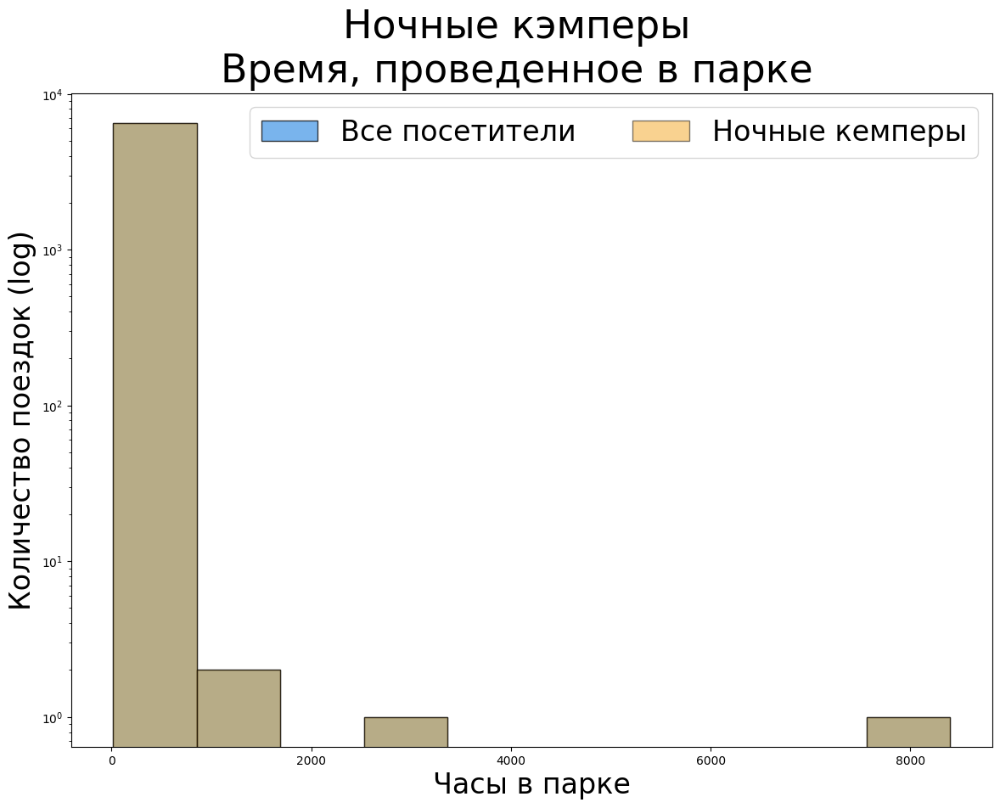

In [56]:
def camp_time_in_park_histogram(stats: pd.DataFrame):    
    fig, ax = plt.subplots(1, 1, figsize=(14, 10), sharex=False)
    fig.suptitle(
        "Ночные кэмперы\nВремя, проведенное в парке",
        fontsize=33,
    )
    ax.hist(
        stats["duration_h"],
        color="#4C9BE8",
        alpha=0.75,
        label=f"Все посетители",
        ec="black",
    )
    ax.hist(
        stats["duration_h"],
        color="#F5A623",
        alpha=0.5,
        label=f"Ночные кемперы",
        ec="black",
    )
    ax.set_yscale("log")
    ax.set_xlabel("Часы в парке", fontsize=24)
    ax.set_ylabel("Количество поездок (log)", fontsize=24)
    ax.legend(fontsize=24, ncol=3)
    plt.show()

overnight = stats[stats["is_overnight"]]
camp_time_in_park_histogram(overnight)

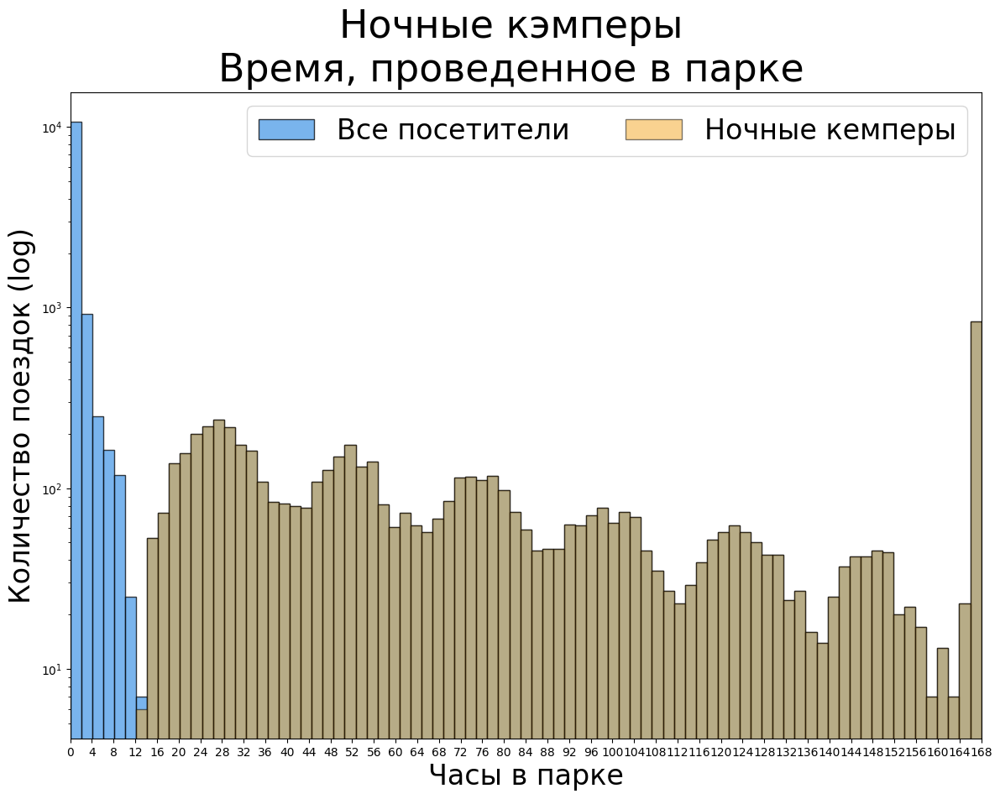

In [57]:
fig, ax = plt.subplots(1, 1, figsize=(14, 10), sharex=False)
fig.suptitle(
    "Ночные кэмперы\nВремя, проведенное в парке",
    fontsize=33,
)
bins_all = np.linspace(0, 168, 84)
ax.hist(
    stats["duration_h"].clip(0, 168),
    bins=bins_all,
    color="#4C9BE8",
    alpha=0.75,
    label=f"Все посетители",
    ec="black",
)
ax.hist(
    overnight["duration_h"].clip(0, 168),
    bins=bins_all,
    color="#F5A623",
    alpha=0.5,
    label=f"Ночные кемперы",
    ec="black",
)
ax.set_yscale("log")
ax.set_xlabel("Часы в парке", fontsize=24)
ax.set_ylabel("Количество поездок (log)", fontsize=24)
ax.legend(fontsize=24, ncol=3)
ax.set_xlim(0, 168)
plt.xticks(np.arange(0, 172, 4.0))
plt.show()

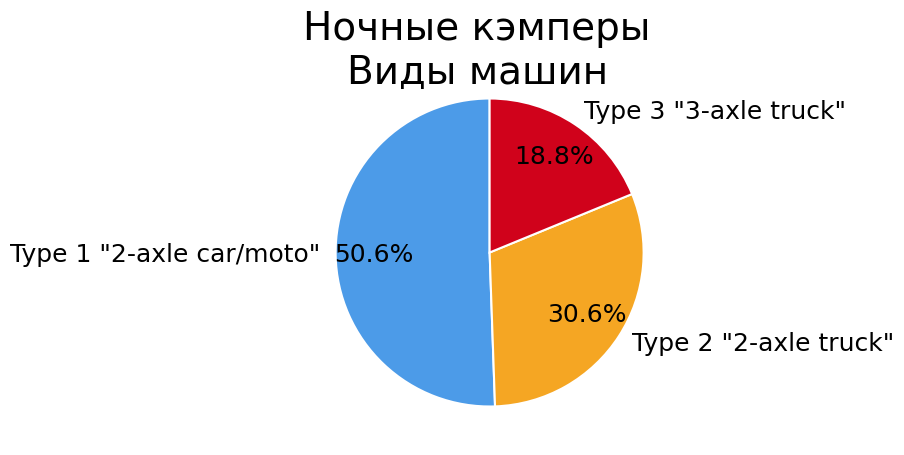

In [60]:
VEHICLE_LABELS = {
    "1": 'Type 1 "2-axle car/moto"',
    "2": 'Type 2 "2-axle truck"',
    "2P": 'Type 2P "Park Service"',
    "3": 'Type 3 "3-axle truck"',
    "4": 'Type 4 "4-axle truck"',
    "5": 'Type 5 "2-axle bus"',
    "6": 'Type 6 "3-axle bus"',
}
VTYPE_COLORS = {
    "1": "#4C9BE8",
    "2": "#F5A623",
    "2P": "#7ED321",
    "3": "#D0021B",
    "4": "#9013FE",
    "5": "#50E3C2",
    "6": "#B8860B",
}

def camp_vehicle_pie(stats: pd.DataFrame):
    fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    fig.suptitle("Ночные кэмперы\nВиды машин", fontsize=28)
    vt = stats["car_type"].value_counts()
    labels = [f"{VEHICLE_LABELS.get(v, v)}" for v, cnt in vt.items()]
    colors = [VTYPE_COLORS.get(v, "#cccccc") for v in vt.index]
    ax.pie(
        vt.values,
        autopct="%.1f%%",
        labels=labels,
        colors=colors,
        startangle=90,
        wedgeprops={"edgecolor": "white", "linewidth": 1.5},
        pctdistance=0.75,
        textprops={"fontsize": 18},
    )
    plt.show()

overnight = stats[stats["is_overnight"]]
camp_vehicle_pie(overnight)

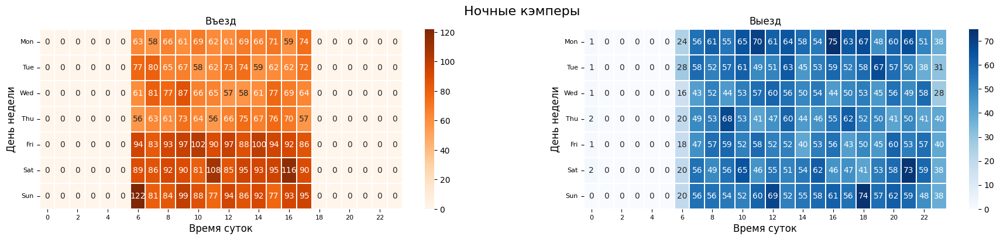

In [69]:
def _dow_hour_heatmap(series_dow, series_hour, ax, title, cmap="YlOrRd"):
    pivot = (
        pd.DataFrame({"dow": series_dow, "hour": series_hour})
        .groupby(["dow", "hour"])
        .size()
        .unstack(fill_value=0)
    )
    pivot = pivot.reindex(range(7), fill_value=0)
    pivot = pivot.reindex(columns=range(24), fill_value=0)
    pivot.index = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
    sns.heatmap(
        pivot,
        ax=ax,
        cmap=cmap,
        linewidths=0.3,
        linecolor="white",
        xticklabels=2,
        annot=True,
        fmt="d",
    )
    ax.set_title(title, fontsize=12)
    ax.set_xlabel("Время суток", fontsize=12)
    ax.set_ylabel("День недели", fontsize=12)
    ax.tick_params(axis="y", rotation=0, labelsize=8)
    ax.tick_params(axis="x", labelsize=8)

def camp_arrival_departure_heatmaps(stats: pd.DataFrame):
    fig, axes = plt.subplots(1, 2, figsize=(22, 4))
    fig.suptitle(
        "Ночные кэмперы\n",
        fontsize=16,
    )
    _dow_hour_heatmap(
        stats["entry_dow"],
        stats["entry_hour"],
        axes[0],
        title="Въезд",
        cmap="Oranges",
    )
    _dow_hour_heatmap(
        stats["exit_dow"],
        stats["exit_hour"],
        axes[1],
        title="Выезд",
        cmap="Blues",
    )
    plt.show()

overnight = stats[stats["is_overnight"]]
camp_arrival_departure_heatmaps(overnight)

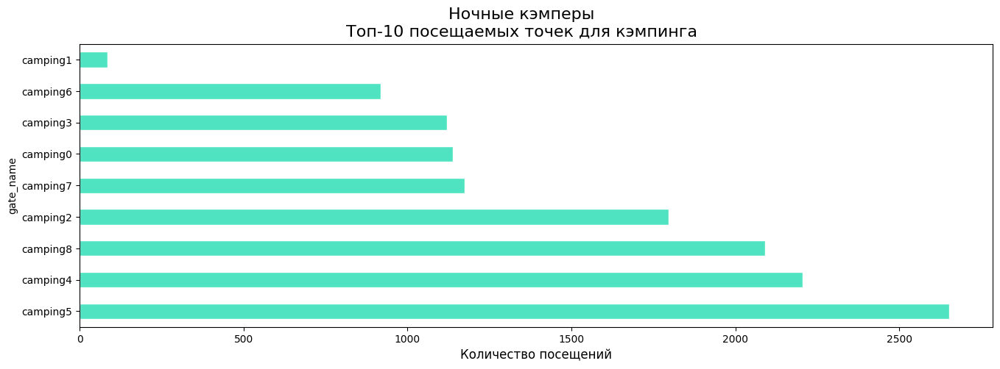

In [74]:
def camp_top_stations_hist(df: pd.DataFrame):
    fig, ax = plt.subplots(1, 1, figsize=(16, 5))
    fig.suptitle("Ночные кэмперы\nТоп-10 посещаемых точек для кэмпинга", fontsize=16)
    top = df["gate_name"].value_counts().head(10)
    top.plot(kind="barh", ax=ax, color="#50E3C2", edgecolor="white")
    ax.set_xlabel("Количество посещений", fontsize=12)
    plt.show()

overnight = stats[stats["is_overnight"]]
camp_df = df[df["car_id"].isin(overnight.index) & (df["sensor_type"] == "Camping")]
camp_top_stations_hist(camp_df)

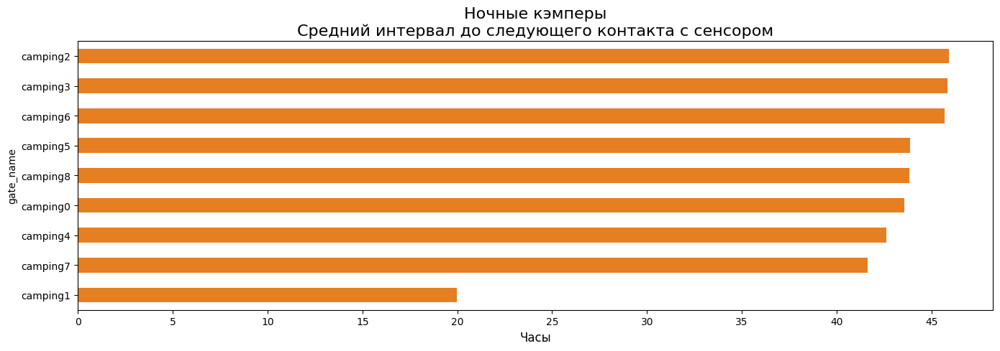

In [79]:
def camp_duration_histogram(df: pd.DataFrame):    
    fig, ax = plt.subplots(1, 1, figsize=(14, 5))
    avg_interval = df.groupby("gate_name")["time_since_prev"].apply(
        lambda x: x.dt.total_seconds().mean() / 3600
    )
    avg_interval.sort_values().plot(kind="barh", color="#e67e22")
    plt.title(
        "Ночные кэмперы\nСредний интервал до следующего контакта с сенсором", fontsize=16
    )
    ax.set_xlabel("Часы", fontsize=12)
    plt.xticks(np.arange(0, 50, 5))
    plt.tight_layout()
    plt.show()

overnight = stats[stats["is_overnight"]]
camp_df = df[df["car_id"].isin(overnight.index) & (df["sensor_type"] == "Camping")]
camp_duration_histogram(camp_df)

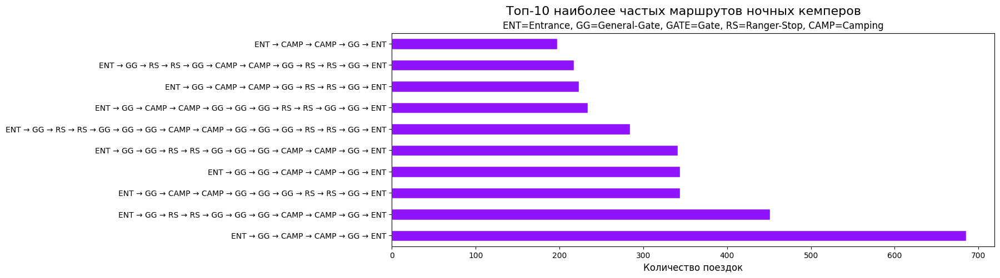

In [82]:
def camp_top_routes(df: pd.DataFrame, stats: pd.DataFrame,
                       top_n: int = 10):
    ids = stats.index
    sub = df[df["car_id"].isin(ids)].copy()
    # Сокращённый маршрут по типам сенсоров
    def abbreviate(name):
        for prefix, stype in SENSOR_TYPES.items():
            if name.startswith(prefix):
                abbrev = {
                    "Entrance": "ENT",
                    "General-Gate": "GG",
                    "Gate": "GATE",
                    "Ranger-Stop": "RS",
                    "Camping": "CAMP",
                }.get(stype, "?")
                return abbrev
        return "?"
    sub["sensor_abbrev"] = sub["gate_name"].apply(abbreviate)
    short_routes = sub.groupby("car_id")["sensor_abbrev"].apply(lambda x: " → ".join(x))
    top_short = pd.Series(Counter(short_routes)).nlargest(top_n)
    fig, ax = plt.subplots(1, 1, figsize=(14, 5))
    fig.suptitle(
        f"Топ-{top_n} наиболее частых маршрутов ночных кемперов\n",
        fontsize=16,
    )
    top_short.sort_values().plot(kind="barh", ax=ax, color="#9013FE", edgecolor="white")
    ax.set_title(
        f"ENT=Entrance, GG=General-Gate, GATE=Gate, RS=Ranger-Stop, CAMP=Camping",
        fontsize=12,
    )
    ax.set_xlabel("Количество поездок", fontsize=12)
    ax.tick_params(axis="y", labelsize=10)
    ax.invert_yaxis()
    plt.show()

overnight = stats[stats["is_overnight"]]
camp_top_routes(df, overnight, top_n=10)

In [41]:
def to_rgba(hex_color: str, alpha: float = 0.42) -> str:
    """Конвертирует HEX в RGBA с прозрачностью."""
    h = hex_color.lstrip("#")
    r, g, b = int(h[0:2], 16), int(h[2:4], 16), int(h[4:6], 16)
    return f"rgba({r},{g},{b},{alpha})"


def sankey_by_hypothesis_diagram(df, stats, top_n: int, min_flow: int, visitors="all"):
    """
    Строит Sankey-диаграмму для топовых маршрутов ночных кэмперов.
    Окрашивает маршруты по кластерам route_cluster_1.
    """

    if visitors == "overnight":
        ids = stats[stats["is_overnight"]].index
        txt = "ночных кэмперов"
    elif visitors == "rangers":
        ids = stats[stats["is_ranger"]].index
        txt = "рэнжеров"
    elif visitors == "thrutraffic":
        ids = stats[stats["is_thrutraffic"]].index
        txt = "тех, кто срезает"
    else:
        ids = stats.index    
        txt = "всех"
        
    trips = (
            df[df["car_id"].isin(ids)]
            .sort_values(["car_id", "timestamp"])
    ) 

    # Собираем полный маршрут для каждой машины
    routes = trips.groupby("car_id")["gate_name"].apply(list)

    # Связываем маршруты с кластерами
    route_to_cluster = {}
    for car_id in routes.index:
        if car_id in stats.index:
            route_tuple = tuple(routes[car_id])
            cluster = stats.loc[car_id, 'route_cluster_1']
            route_to_cluster[route_tuple] = cluster

    route_counts = Counter(tuple(route) for route in routes)
    top_routes = route_counts.most_common(top_n)

    total_overnight = len(ids)
    covered_trips = sum(count for _, count in top_routes)

    # Построение ребер переходов между сенсорами, подсчет весов
    edge_weights = Counter()
    edge_to_cluster = {}  # Связываем каждое ребро с кластером маршрута

    for route, count in top_routes:
        cluster = route_to_cluster.get(route, -1)  # -1 если кластер не найден

        # Разбиваем маршрут на переходы: шаг_i → шаг_i+1
        for step in range(len(route) - 1):
            source = f"step{step}::{route[step]}"
            target = f"step{step + 1}::{route[step + 1]}"
            edge = (source, target)
            edge_weights[edge] += count

            # Сохраняем кластер для каждого ребра
            # Если ребро используется в нескольких кластерах, берём тот, где больше поток
            if edge not in edge_to_cluster:
                edge_to_cluster[edge] = (cluster, count)
            else:
                prev_cluster, prev_count = edge_to_cluster[edge]
                # Выбираем кластер с наибольшим потоком через это ребро
                if count > prev_count:
                    edge_to_cluster[edge] = (cluster, count)

    # Убираем редкие переходы
    filtered_edges = {edge: weight for edge, weight in edge_weights.items()
                      if weight >= min_flow}

    # Обновляем edge_to_cluster только для отфильтрованных рёбер
    edge_to_cluster = {edge: cluster_info[0] for edge, cluster_info in edge_to_cluster.items()
                       if edge in filtered_edges}

    edge_weights = filtered_edges

    # Группируем узлы по шагам для правильного расположения слева направо
    step_buckets = {}

    for source, target in edge_weights:
        for node in (source, target):
            step_num = int(node.split("::")[0].replace("step", ""))
            if step_num not in step_buckets:
                step_buckets[step_num] = []
            if node not in step_buckets[step_num]:
                step_buckets[step_num].append(node)

    # Собираем узлы по порядку
    all_nodes = []
    for step in sorted(step_buckets):
        all_nodes.extend(step_buckets[step])

    node_to_index = {node: idx for idx, node in enumerate(all_nodes)}

    # Для каждого узла определяем доминирующий кластер
    node_cluster_flows = {node: Counter() for node in all_nodes}

    for (source, target), weight in edge_weights.items():
        cluster = edge_to_cluster.get((source, target), -1)
        node_cluster_flows[source][cluster] += weight
        node_cluster_flows[target][cluster] += weight

    # Выбираем кластер с максимальным потоком для каждого узла
    node_to_cluster = {}
    for node, cluster_flows in node_cluster_flows.items():
        if cluster_flows:
            node_to_cluster[node] = cluster_flows.most_common(1)[0][0]
        else:
            node_to_cluster[node] = -1

    # Считаем поток через каждый узел
    node_flow = Counter()
    for (source, target), weight in edge_weights.items():
        node_flow[source] += weight
        node_flow[target] += weight

    # Добавляем метки и цвета
    def create_node_label(node: str) -> str:
        """Создаёт метку узла: название_ворот + кластер + шаг + количество поездок."""
        step_str, gate_name = node.split("::", 1)
        step_num = step_str.replace("step", "")
        flow = node_flow[node]
        cluster = node_to_cluster[node]
        cluster_text = "шум" if cluster == -1 else f"кл. {cluster}"
        return f"{gate_name}<br><sup>{cluster_text} · шаг {step_num} · {flow:,} поездок</sup>"

    def get_node_color(node: str) -> str:
        """Возвращает цвет узла на основе его кластера."""
        cluster = node_to_cluster[node]
        return CLUSTER_COLORS.get(cluster, '#ED7953')

    node_labels = [create_node_label(node) for node in all_nodes]
    node_colors = [get_node_color(node) for node in all_nodes]

    # Формируем данные для ребер (окрашиваем по кластеру маршрута)
    sources = [node_to_index[src] for src, _ in edge_weights]
    targets = [node_to_index[tgt] for _, tgt in edge_weights]
    values = list(edge_weights.values())
    link_colors = [
        to_rgba(CLUSTER_COLORS.get(edge_to_cluster.get((src, tgt), -1), '#ED7953'), alpha=0.35)
        for src, tgt in edge_weights
    ]

    fig = go.Figure(go.Sankey(
        arrangement="snap",  # Выравнивание узлов по вертикальным слоям
        node=dict(
            label=node_labels,
            color=node_colors,
            pad=14,
            thickness=20,
            line=dict(color="white", width=0.5),
            hovertemplate="<b>%{label}</b><br>Суммарный поток: %{value:,}<extra></extra>",
        ),
        link=dict(
            source=sources,
            target=targets,
            value=values,
            color=link_colors,
            hovertemplate="%{source.label} → %{target.label}<br>Поездок: %{value:,}<extra></extra>",
        ),
    ))

    coverage_pct = 100 * covered_trips / max(total_overnight, 1)

    fig.update_layout(
        title=dict(
            text=(
                f"Топ-{top_n} маршрутов среди {txt}<br>"
                f"<sub>Покрывают {covered_trips:,} из {total_overnight:,} поездок ({coverage_pct:.1f}%)<br>"
                f"Всего {len(route_counts):,} уникальных маршрутов</sub>"
            ),
            x=0.5,
            xanchor="center",
            font=dict(size=16),
        ),
        font=dict(size=10, family="DejaVu Sans"),
        height=800,
        margin=dict(l=30, r=200, t=110, b=30),
        paper_bgcolor="#f8f9fa",
    )
    fig.show()
    
# visitors = thrutraffic / overnight / rangers / all
sankey_by_hypothesis_diagram(df, stats, top_n=10, min_flow=5, visitors="overnight") 

### Транзитные маршруты

Далее рассмотрены транзитные маршруты.

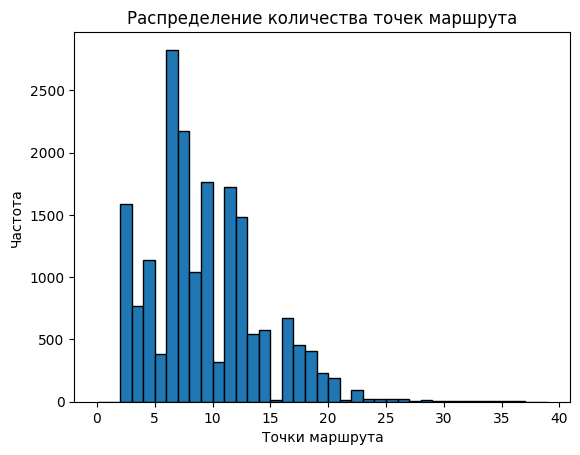

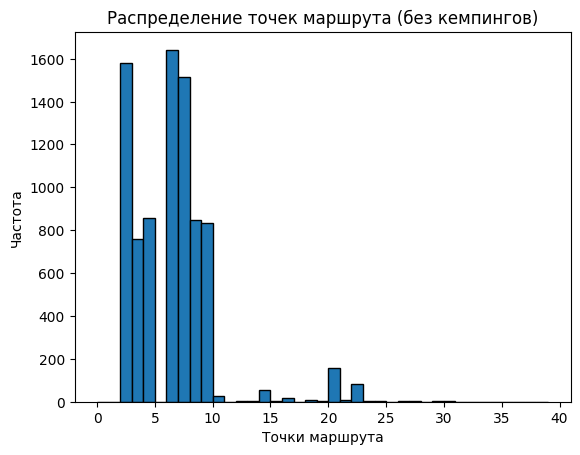

In [83]:
plt.hist(stats['n_events'], bins=range(40), edgecolor='black')
plt.title('Распределение количества точек маршрута')
plt.xlabel('Точки маршрута')
plt.ylabel('Частота')
plt.show()
plt.hist(stats.loc[~stats['visited_camping'], 'n_events'], bins=range(40), edgecolor='black')
plt.title('Распределение точек маршрута (без кемпингов)')
plt.xlabel('Точки маршрута')
plt.ylabel('Частота')
plt.show()

Можно видеть, что распределение количества точек маршрутов, которые не проходят через кемпинги сдвинуто ближе к нулю, чем общее распределение, что подкрепляет гипотезу о существовании группы маршрутов, которые проезжаеют парк, не задерживаясь.

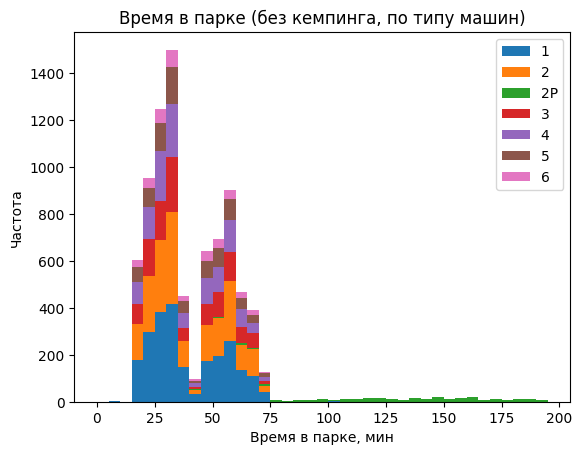

In [84]:
stats_no_camping = stats[~stats['visited_camping']].copy()
stats_no_camping['duration_min'] = stats_no_camping['duration_h'] * 60.0

car_types = sorted(stats_no_camping['car_type'].unique())
hist_data = [stats_no_camping[stats_no_camping['car_type'] == car_type]['duration_min'] for car_type in car_types]

plt.hist(hist_data, stacked=True, bins=range(0, 200, 5), label=car_types)
plt.title('Время в парке (без кемпинга, по типу машин)')
plt.xlabel('Время в парке, мин')
plt.ylabel('Частота')
plt.legend()
plt.show()

На гистограмме времени проведённого в парке чётко видно, что максимальное время пребывания людей - не-кемперов - 75 минут, что в разы меньше в сравнении с людьми, которые ночуют в кемпинге, тем самым это даёт основания для отделения этой группы людей от тех, что проводят время в кемпинге. За короткое время, не пребывая в кемпинге, можно в том числе проезжать парк насквозь (транзит)

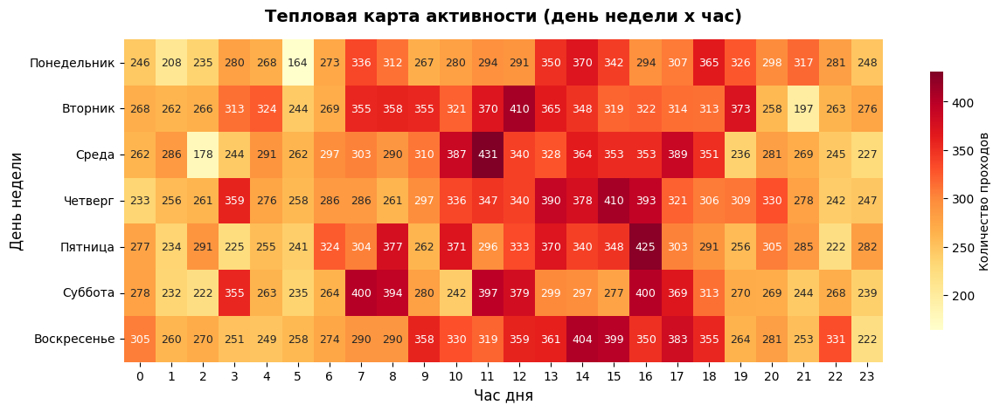

In [86]:
transit_df = df[df['car_id'].isin(stats_no_camping.index)].copy()

heatmap_data = pd.crosstab(transit_df['dow'], transit_df['hour'])
heatmap_data = heatmap_data.reindex(index=range(7), columns=range(24), fill_value=0)

plt.figure().set_figwidth(14)
ax = plt.subplot()
sns.heatmap(heatmap_data, ax=ax, cmap='YlOrRd', annot=True, fmt='d', cbar_kws={'label': 'Количество проходов', 'shrink': 0.8}, annot_kws={'size': 9}, square=False)
ax.set_title('Тепловая карта активности (день недели x час)', fontweight='bold', fontsize=14, pad=15)
ax.set_xlabel('Час дня', fontsize=12)
ax.set_ylabel('День недели', fontsize=12)
ax.set_yticklabels(['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'], rotation=0)
ax.set_xticks(np.arange(24) + 0.5)
ax.set_xticklabels(range(24), rotation=0)
plt.show()

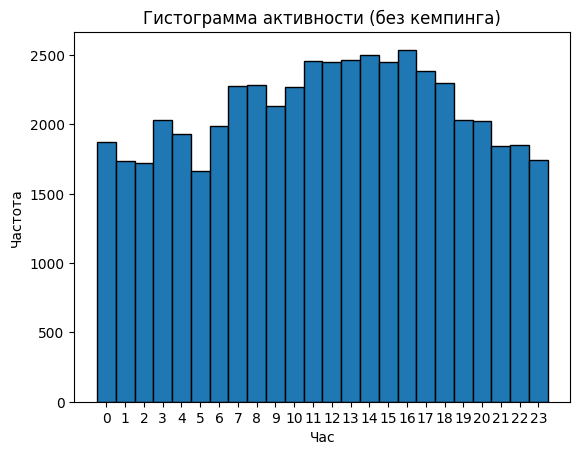

In [ ]:
hourly_counts = transit_df['hour'].value_counts().sort_index().reindex(range(24), fill_value=0)

plt.bar(hourly_counts.index, hourly_counts.values, 1, edgecolor='black', align='center')
plt.xlabel('Час')
plt.ylabel('Частота')
plt.title('Гистограмма активности (без кемпинга)')
plt.xticks(range(24))
plt.show()

По данным тепловой карты и гистограммы активности видно, что пик активности достигается в дневное время суток, однако разница между дневным максимумом и ночным минимумом составляет лишь около 1,5 раз, что говорит о достаточно равномерной активности посетителей на протяжении всех суток.

In [87]:
sankey_by_hypothesis_diagram(df, stats, top_n=10, min_flow=5, visitors="thrutraffic")

По диагармме sankey также можно видеть, что маршруты данной группы машин не проходит через кемпинги. Более того, подавляющее большинство маршрутов проходят через `ranger-stop0` и `ranger-stop1`. Объясняется это тем, что для обычных посетителей парк разделён на западную и восточную части, которые соединены только одной дорогой, пролегающей через эти два пункта

### Рейнджеры 

Рейнджеры являются работниками парка, которых можно определить по типу машины `2P`.

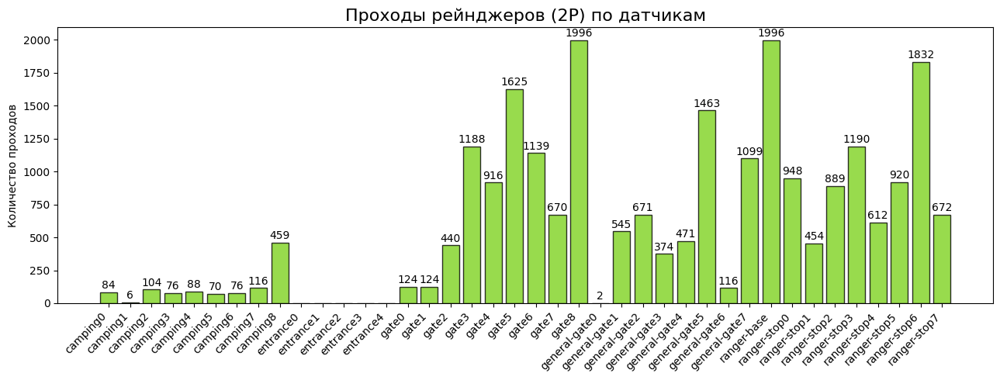

In [95]:
ranger_cars = stats[stats["is_ranger"] == True].index
ranger_df = df[df["car_id"].isin(ranger_cars)].copy()

# Гистограмма по датчикам
plt.figure(figsize=(13, 5))
all_gates = sorted(df['gate_name'].unique())
ranger_gate_counts = ranger_df['gate_name'].value_counts().reindex(all_gates, fill_value=0)
bars = plt.bar(range(len(all_gates)), ranger_gate_counts.values, 
               color=VTYPE_COLORS["2P"], alpha=0.8, edgecolor='black')
plt.title('Проходы рейнджеров (2P) по датчикам', fontsize=16)
plt.xticks(range(len(all_gates)), all_gates, rotation=45, ha='right')
plt.ylabel('Количество проходов')
for bar, val in zip(bars, ranger_gate_counts.values):
    if val > 0:
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10, 
                str(int(val)), ha='center', va='bottom')
plt.tight_layout()
plt.show()

Маршруты рейнджеров лежат внутри парка - они не выезжают за его пределы. Кроме того, как правило они не заезжают на кемпинги - датчики срабатывают лишь на кемпингах, которые находятся по пути к ranger-stops. При визуализации данных с помощью разработанного `/gui` видно, что рейнджеры путешествуют по одному и тому же машруту. За один объезд машина проезжает либо маршрут целиком, либо его часть.

Это также можно увидеть на визуализации топ-5 маршрутов ниже.

In [96]:
sankey_by_hypothesis_diagram(ranger_df, stats, top_n=5, min_flow=5, visitors="rangers") 

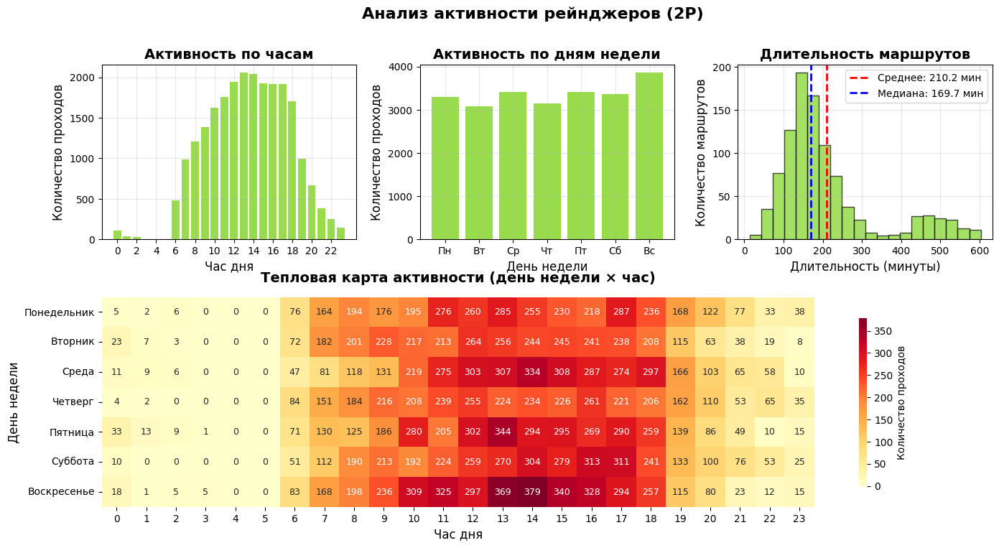

In [101]:
# 2. Активность по времени и дням недели + длительность маршрутов
ranger_df['date'] = ranger_df['timestamp'].dt.date

route_durations = []
ranger_stats = stats.loc[ranger_cars] 
route_durations = (ranger_stats['duration_h'] * 60).tolist()
fig = plt.figure(figsize=(16, 8))
gs = fig.add_gridspec(2, 3, height_ratios=[1, 1.2], hspace=0.3, wspace=0.25)
days_ru = ['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс']
days_ru_full = ['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье']

# По часам
ax1 = fig.add_subplot(gs[0, 0])
hour_counts = ranger_df['hour'].value_counts().sort_index()
bars1 = ax1.bar(hour_counts.index, hour_counts.values, color=VTYPE_COLORS["2P"], alpha=0.8)
ax1.set_title('Активность по часам', fontweight='bold', fontsize=14)
ax1.set_xlabel('Час дня', fontsize=12)
ax1.set_ylabel('Количество проходов', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.set_xticks(range(0, 24, 2))

# По дням недели 
ax2 = fig.add_subplot(gs[0, 1])
day_counts = ranger_df['dow'].value_counts().sort_index()
bars2 = ax2.bar(range(7), day_counts.reindex(range(7), fill_value=0).values, 
                color=VTYPE_COLORS["2P"], alpha=0.8)
ax2.set_title('Активность по дням недели', fontweight='bold', fontsize=14)
ax2.set_xlabel('День недели', fontsize=12)
ax2.set_ylabel('Количество проходов', fontsize=12)
ax2.set_xticks(range(7))
ax2.set_xticklabels(days_ru, rotation=0)
ax2.grid(True, alpha=0.3)

# Длительность маршрутов
ax3 = fig.add_subplot(gs[0, 2])
if route_durations:
    bins = 20
    n, bins, patches = ax3.hist(route_durations, bins=bins, color=VTYPE_COLORS["2P"], 
                               alpha=0.7, edgecolor='black')
    ax3.set_title('Длительность маршрутов', fontweight='bold', fontsize=14)
    ax3.set_xlabel('Длительность (минуты)', fontsize=12)
    ax3.set_ylabel('Количество маршрутов', fontsize=12)
    ax3.grid(True, alpha=0.3)
    mean_duration = np.mean(route_durations)
    median_duration = np.median(route_durations)
    ax3.axvline(mean_duration, color='red', linestyle='--', linewidth=2, 
                label=f'Среднее: {mean_duration:.1f} мин')
    ax3.axvline(median_duration, color='blue', linestyle='--', linewidth=2, 
                label=f'Медиана: {median_duration:.1f} мин')
    ax3.legend(fontsize=10)
else:
    ax3.text(0.5, 0.5, 'Нет данных для анализа длительности', 
             ha='center', va='center', transform=ax3.transAxes, fontsize=12)
    ax3.set_title('Длительность маршрутов', fontweight='bold', fontsize=14)

# Тепловая карта 
ax4 = fig.add_subplot(gs[1, :])  
heatmap_data = pd.crosstab(ranger_df['dow'], ranger_df['hour'])
heatmap_data = heatmap_data.reindex(index=range(7), columns=range(24), fill_value=0)
sns.heatmap(heatmap_data, ax=ax4, cmap='YlOrRd', annot=True, fmt='d', 
            cbar_kws={'label': 'Количество проходов', 'shrink': 0.8},
            annot_kws={'size': 9}, square=False)
ax4.set_title('Тепловая карта активности (день недели × час)', fontweight='bold', fontsize=14, pad=15)
ax4.set_xlabel('Час дня', fontsize=12)
ax4.set_ylabel('День недели', fontsize=12)
ax4.set_yticklabels(days_ru_full, rotation=0)
ax4.set_xticks(np.arange(24) + 0.5)
ax4.set_xticklabels(range(24), rotation=0)
fig.suptitle('Анализ активности рейнджеров (2P)', fontsize=16, fontweight='bold', y=0.98)
plt.show()


Были рассмотрены маршруты рейнджеров с точки зрения времени. Как видно по гистограммам активности и тепловой карте, рейнджеры проезжают парк с 6 до 18 каждый день недели. Интенсивность активности в течение недели не меняется - лишь в воскресенье есть небольшое увеличение активности, что может быть связано с количеством туристов (уезжают из кемпинга перед рабочей неделей или приехали на природу в выходной). 

Длительность маршрутов варьируется, что связано со сказанным выше - рейнджеры не всегда проезжают полный маршрут по парку - они чаще проезжают его маленькими кусочками, могут делиться, чтобы кто-то проехал одну часть маршрута, а кто-то другую.

На тепловой карте присутствует активность после 18 и до 2-3 часов ночи, то есть вне расписания. Рассмотрим, существуют ли поездки, начавшиеся после 18:00

In [ ]:
def is_night_start(hour):
    return hour >= 18
rangers = stats[stats["is_ranger"] == True].copy()
# Маршруты, которые начались после 18:00
ranger_night = rangers[
    rangers["entry_hour"].apply(is_night_start)
].copy()
print("Всего маршрутов рейнджеров после 18 часов:", len(ranger_night))

Всего маршрутов рейнджеров после 18 часов: 0


Согласно полученным данным, все маршруты рейнджеров начинаются до 18 часов. То есть вечерняя активность - это затянувшиеся объезды рейнджерами парка, поэтому их можно не относить к аномалиям.

### Рассеяние по типу маршрута (количество датчиков и время пребывания)

Для классификации по цели маршрута была построена диаграмма рассеяния.

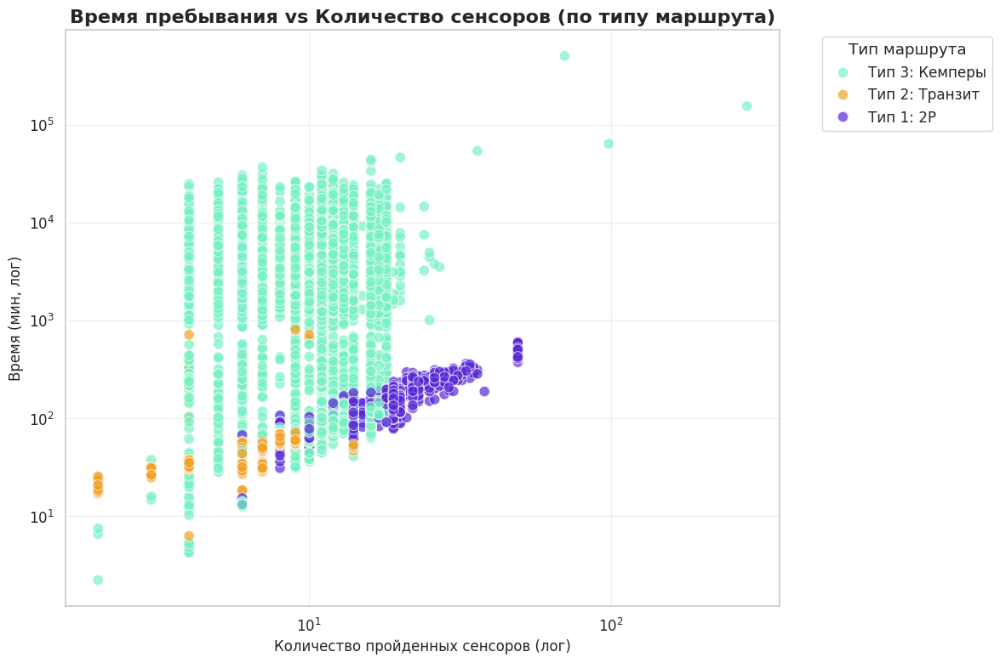

In [103]:
sns.set(style="whitegrid")

def get_route_type(group):
    car_type = group['car_type'].iloc[0]
    gates = group['gate_name'].unique().tolist()
    
    if '2P' in str(car_type):
        return 'Тип 1: 2P'
    
    has_camping = any('camp' in str(g).lower() for g in gates)
    if has_camping:
        return 'Тип 3: Кемперы'
    else:
        return 'Тип 2: Транзит'
results = []
for car_id, group in df.groupby('car_id'):
    route_type = get_route_type(group)
    results.append({
        'car_id': car_id,
        'sensors_count': len(group),
        'time_spent': (group['timestamp'].max() - group['timestamp'].min()).total_seconds() / 60,
        'route_type': route_type
    })
summary_df = pd.DataFrame(results)
custom_palette = {
    'Тип 1: 2P': "#5627d6",
    'Тип 2: Транзит': "#f3a125", 
    'Тип 3: Кемперы': "#76f1c2"  
}
plt.figure(figsize=(12, 8))
sns.set_context("notebook", font_scale=1.1)
ax = sns.scatterplot(
    data=summary_df, 
    x='sensors_count', 
    y='time_spent', 
    hue='route_type', 
    palette=custom_palette, 
    alpha=0.7, s=80
)
ax.set_xscale('log')
ax.set_yscale('log')
plt.title('Время пребывания vs Количество сенсоров (по типу маршрута)', fontsize=16, fontweight='bold')
plt.xlabel('Количество пройденных сенсоров (лог)', fontsize=12)
plt.ylabel('Время (мин, лог)', fontsize=12)
plt.legend(title='Тип маршрута', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Согласно полученной диаграмме, точки транзитных маршрутов и маршрутов рейнджеров (2Р) лежат практически на прямой, что говорит о том, что эти маршруты не содержат длительных остановок и поэтому время пребывания в поездке линейно зависит от количества посещенных точек парка. Кемперы имеют наиболее рассеянное количество точек с увеличением времени относительно количества пройденных сенсоров, что, опять же, связано с остановками - пикники и ночевки на кемпингах затрачивают много времени.

При анализе полученной визуализации внимание привлекли несколько точек, принадлежащих транзитным маршрутам, которые находятся не на прямой, а выше нее - на середине разброса точек кемперов. В части 3, посвященной аномалиям и нарушениям, будет проведен дополнительный анализ этих маршрутов.

# Анализ нарушений

## Долгие транзитные маршруты

Как было ранее сказано, среди транзитных маршрутов есть несколько слишком долгих по времени относительно количества сенсоров. 

Аномальные транзитные маршруты:
                   car_id  duration_h  sensors_count      route_type
515    20150204100226-134   10.647500             11  Тип 2: Транзит
948    20150322080300-861   11.400000              9  Тип 2: Транзит
7243   20152810102803-808    1.673889              4  Тип 2: Транзит
7244   20152810102819-458    3.589444              4  Тип 2: Транзит
7245   20152810102828-459    6.013056              4  Тип 2: Транзит
7511   20152910102928-970    5.470000              4  Тип 2: Транзит
7514   20152910102959-782    4.248611              4  Тип 2: Транзит
7769   20153010103017-871    3.857500              4  Тип 2: Транзит
8956    20153427103455-30   10.892778             10  Тип 2: Транзит
11648  20154501084537-684   11.919444              4  Тип 2: Транзит
15831  20160623090611-424   11.988889             10  Тип 2: Транзит
16011  20161008061012-639   13.442778              9  Тип 2: Транзит
Всего найдено: 12


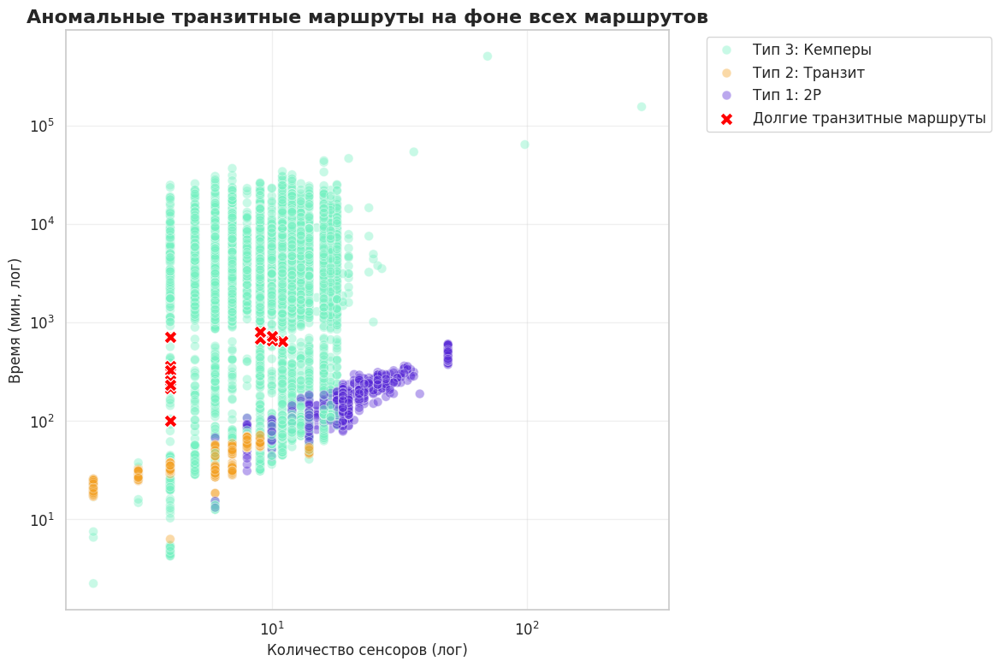

In [104]:
stats["is_thrutraffic_nominal"] = (
    (~stats["visited_camping"]) &
    (stats["car_type"] != "2P")
)
stats_with_summary = stats.merge(
    summary_df[["car_id", "sensors_count", "route_type"]],
    left_index=True, right_on="car_id", how="left"
)
median_by_sensors = (
    stats_with_summary[stats_with_summary["is_thrutraffic_nominal"]]
    .groupby("sensors_count")["duration_h"]
    .median()
)
stats_with_summary["median_duration_by_sensors"] = stats_with_summary["sensors_count"].map(median_by_sensors)
long_thrutraffic_summary = stats_with_summary[
    stats_with_summary["is_thrutraffic_nominal"] &
    (
        (stats_with_summary["duration_h"] > stats_with_summary["median_duration_by_sensors"] * 2) |
        (stats_with_summary["duration_h"] > 2)
    )
]
print("Аномальные транзитные маршруты:")
print(long_thrutraffic_summary[["car_id", "duration_h", "sensors_count", "route_type"]].head(20))
print(f"Всего найдено: {len(long_thrutraffic_summary)}")
plt.figure(figsize=(12, 8))
sns.set_context("notebook", font_scale=1.1)
# Все маршруты
ax = sns.scatterplot(
    data=summary_df,
    x="sensors_count",
    y="time_spent",
    hue="route_type",
    palette={"Тип 1: 2P": "#5627d6", "Тип 2: Транзит": "#f3a125", "Тип 3: Кемперы": "#76f1c2"},
    alpha=0.4, s=60
)
# Аномальные транзиты
sns.scatterplot(
    data=long_thrutraffic_summary,
    x="sensors_count",
    y=long_thrutraffic_summary["duration_h"] * 60,
    color="red",
    marker="X",
    s=120,
    label="Долгие транзитные маршруты"
)
ax.set_xscale("log")
ax.set_yscale("log")
plt.title("Аномальные транзитные маршруты на фоне всех маршрутов", fontsize=16, fontweight="bold")
plt.xlabel("Количество сенсоров (лог)", fontsize=12)
plt.ylabel("Время (мин, лог)", fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


Аномальными считались маршруты, у которых длительность превышала медиану вдвое среди маршрутов с таким же количеством сенсоров, или маршруты, у которых длительность больше 2 часов. Второй критерий был выбран визуально на основе исходного скаттерплота для маршрутов, с уникальным количеством сенсоров.

Созданная ранее диаграмма рессяния была дополнена точками аномальных транзитных маршрутов. Так, было выявлено 12 подозрительных:

| car_id             | duration_h | sensors_count | route_type     |
|--------------------|------------|---------------|----------------|
| 20150204100226-134 | 10.647500  | 11            | Тип 2: Транзит |
| 20150322080300-861 | 11.400000  | 9             | Тип 2: Транзит |
| 20152810102803-808 | 1.673889   | 4             | Тип 2: Транзит |
| 20152810102819-458 | 3.589444   | 4             | Тип 2: Транзит |
| 20152810102828-459 | 6.013056   | 4             | Тип 2: Транзит |
| 20152910102928-970 | 5.470000   | 4             | Тип 2: Транзит |
| 20152910102959-782 | 4.248611   | 4             | Тип 2: Транзит |
| 20153010103017-871 | 3.857500   | 4             | Тип 2: Транзит |
| 20153427103455-30  | 10.892778  | 10            | Тип 2: Транзит |
| 20154501084537-684 | 11.919444  | 4             | Тип 2: Транзит |
| 20160623090611-424 | 11.988889  | 10            | Тип 2: Транзит |
| 20161008061012-639 | 13.442778  | 9             | Тип 2: Транзит |


Если про маршруты длительностью до 5-6 часов можно сказать, что посетители очень медленно объезжали парк, гуляли и наблюдали за птицами в дневное время, то маршруты длительностью более 10 часов однозначно нарушают правила, ночуя не в кемпинге, а где-то в других местах, не предназначенных для этого. Это подтверждает визуализация ниже.


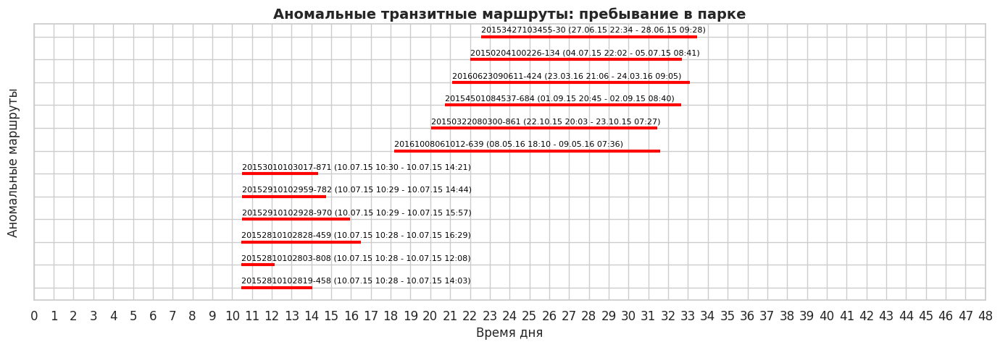

In [107]:
anom_routes = long_thrutraffic_summary.copy()
anom_routes["start_hours"] = (anom_routes["first_time"].dt.hour +
                              anom_routes["first_time"].dt.minute/60)
same_day = anom_routes["first_time"].dt.date == anom_routes["last_time"].dt.date
anom_routes.loc[same_day, "end_hours"] = (anom_routes["last_time"].dt.hour +
                                          anom_routes["last_time"].dt.minute/60)
diff_day = ~same_day
anom_routes.loc[diff_day, "end_hours"] = (anom_routes["start_hours"] +
                                          (anom_routes["last_time"] - anom_routes["first_time"]).dt.total_seconds()/3600)
anom_routes = anom_routes.sort_values("start_hours").reset_index(drop=True)
plt.figure(figsize=(14, 5))
for i, row in anom_routes.iterrows():
    plt.hlines(y=i, xmin=row["start_hours"], xmax=row["end_hours"], color="red", linewidth=3)
    plt.text(row["start_hours"], i+0.2,
             f"{row['car_id']} ({row['first_time'].strftime('%d.%m.%y %H:%M')} - {row['last_time'].strftime('%d.%m.%y %H:%M')})",
             fontsize=8, color="black")
plt.xlim(0, 48)
plt.xticks(range(0, 49, 1))
plt.xlabel("Время дня", fontsize=12)
plt.ylabel("Аномальные маршруты", fontsize=12)
plt.title("Аномальные транзитные маршруты: пребывание в парке", fontsize=14, fontweight="bold")
plt.yticks(range(len(anom_routes)), [""]*len(anom_routes)) 
plt.tight_layout()
plt.show()

### Маршруты, не принадлежащие рейнджерам, но содержащие зоны, доступные только им

В рамках кластеризации `BoW → t-SNE → DBSCAN` были также выявлены несколько маршрутов, которые совершаются не рейнджерами и при этом проезжают метки `gateN`, которые, согласно предоставленному условию, доступны только рейнджерам.

In [108]:
gates = [f"gate{i}" for i in range(1, 9)]
pattern = "|".join(map(re.escape, gates))
mask = (
    (stats["car_type"] != "2P") &
    stats["route"].apply(lambda x: any(x.split().count(gate) > 0 for gate in gates))
)
def found_gates(route):
    found = [gate for gate in gates if route.split().count(gate) > 0]
    return ', '.join(found) if found else 'none'
gate_routes  = (stats.loc[mask]
              .assign(found_gates=stats.loc[mask, "route"].apply(found_gates)) 
              .reset_index(drop=True)
              [["car_id", "car_type", "found_gates",
                "duration_h"]]
              .sort_values("car_id")
)
print(f"Найдено маршрутов с gate1-gate8: {len(gate_routes )}")
display(gate_routes )


Найдено маршрутов с gate1-gate8: 23


,car_id,car_type,found_gates,duration_h
0,20150104020118-228,4,"gate3, gate5, gate6",0.761667
1,20150416040441-902,4,"gate3, gate5, gate6",0.766944
2,20150505020522-625,4,"gate3, gate5, gate6",0.875833
3,20150920030917-854,4,"gate3, gate5, gate6",0.839722
4,20151112031119-409,4,"gate3, gate5, gate6",0.894722
5,20151201031245-77,4,"gate3, gate5, gate6",0.916944
6,20151414041406-386,4,"gate3, gate5, gate6",0.825833
7,20151415031450-923,4,"gate3, gate5, gate6",0.927500
8,20151520021556-881,4,"gate3, gate5, gate6",0.885833
9,20151521021518-235,4,"gate3, gate5, gate6",0.930278


Было выявлено 23 маршрута, которые были в зонах, которые доступны только рейнджерам. Примечательно, что все нарушители ездят на машинах **4 типа (4-осный грузовик (и выше))**, а также принадлежат одному (96) кластеру `BoW -> t-SNE -> DBSCAN`. При этом кластер состоит только из этих маршрутов. Ниже представлена визуализация этих маршрутов:

In [109]:
gate_car_ids = gate_routes["car_id"].tolist()  
gate_stats = stats[stats.index.isin(gate_car_ids)].copy()
gate_stats["is_overnight"] = True
sankey_by_hypothesis_diagram(df, gate_stats, top_n=23, min_flow=1)

Все маршруты нарушителей одинаковые. Посмотрим на временные закономерности.

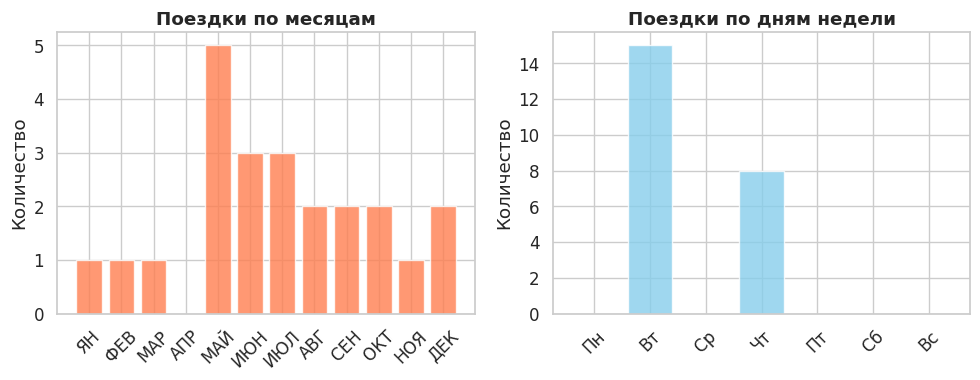

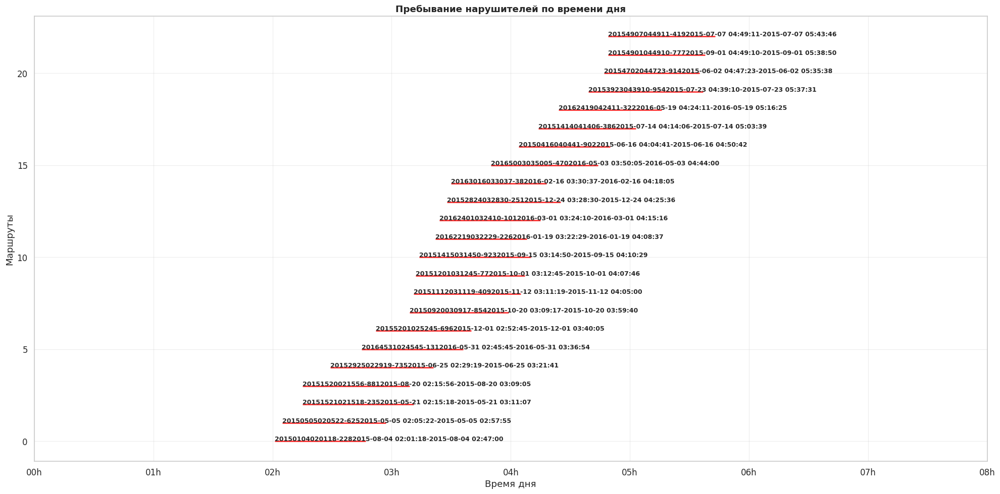

In [113]:
car_ids = gate_routes["car_id"].values
mask_stats = stats.index.isin(car_ids)
time_data = stats.loc[mask_stats, ["first_time", "last_time"]].reindex(car_ids).values
gate_routes["first_time"] = pd.to_datetime(time_data[:, 0])
gate_routes["last_time"] = pd.to_datetime(time_data[:, 1])
month_map = {
    'January': 'ЯН', 'February': 'ФЕВ', 'March': 'МАР', 'April': 'АПР',
    'May': 'МАЙ', 'June': 'ИЮН', 'July': 'ИЮЛ', 'August': 'АВГ',
    'September': 'СЕН', 'October': 'ОКТ', 'November': 'НОЯ', 'December': 'ДЕК'
}
dow_map = {
    'Monday': 'Пн', 'Tuesday': 'Вт', 'Wednesday': 'Ср', 'Thursday': 'Чт',
    'Friday': 'Пт', 'Saturday': 'Сб', 'Sunday': 'Вс'
}
gate_routes["first_month_ru"] = gate_routes["first_time"].dt.month_name().map(month_map)
gate_routes["first_dow_ru"] = gate_routes["first_time"].dt.day_name().map(dow_map)
gate_routes["start_hours"] = gate_routes["first_time"].dt.hour + gate_routes["first_time"].dt.minute/60
same_day = gate_routes["first_time"].dt.date == gate_routes["last_time"].dt.date
gate_routes.loc[same_day, "end_hours"] = (gate_routes["last_time"].dt.hour + gate_routes["last_time"].dt.minute/60)
diff_day = ~same_day
gate_routes.loc[diff_day, "end_hours"] = (gate_routes["start_hours"] + 
                                           (gate_routes["last_time"] - gate_routes["first_time"]).dt.total_seconds()/3600)
gate_routes = gate_routes.sort_values("start_hours").reset_index(drop=True)
fig1 = plt.figure(figsize=(10,4))
# 1. МЕСЯЦЫ
ax1 = plt.subplot(1, 2, 1)
month_counts = gate_routes["first_month_ru"].value_counts()
month_order = ['ЯН', 'ФЕВ', 'МАР', 'АПР', 'МАЙ', 'ИЮН', 'ИЮЛ', 'АВГ', 'СЕН', 'ОКТ', 'НОЯ', 'ДЕК']
month_counts = month_counts.reindex(month_order, fill_value=0)
ax1.bar(range(len(month_counts)), month_counts.values, color='coral', alpha=0.8)
ax1.set_title('Поездки по месяцам', fontweight='bold')
ax1.set_xticks(range(len(month_counts)))
ax1.set_xticklabels(month_counts.index, rotation=45)
ax1.set_ylabel('Количество')
# 2. ДНИ НЕДЕЛИ
ax2 = plt.subplot(1, 2, 2)
dow_order = ['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс']
dow_counts = gate_routes["first_dow_ru"].value_counts().reindex(dow_order, fill_value=0)
ax2.bar(range(len(dow_counts)), dow_counts.values, color='skyblue', alpha=0.8)
ax2.set_title('Поездки по дням недели', fontweight='bold')
ax2.set_xticks(range(len(dow_counts)))
ax2.set_xticklabels(dow_order, rotation=45)
ax2.set_ylabel('Количество')
plt.tight_layout()
plt.show()
# Распределенность по времени
fig2 = plt.figure(figsize=(20, 10))
ax3 = plt.gca()
for i, row in gate_routes.iterrows():
    ax3.hlines(y=i, xmin=row["start_hours"], xmax=row["end_hours"], 
               color='red', linewidth=2, alpha=0.8)
    ax3.text(row["start_hours"], i+0.1, str(row["car_id"])+f"{ row["first_time"]}-{row["last_time"]}", 
             fontsize=9, fontweight='bold', va='center')
ax3.set_xlim(0, 8)
ax3.set_xticks(range(0, 9, 1))
ax3.set_xticklabels([f'{h:02d}h' for h in range(0, 9, 1)])
ax3.set_xlabel('Время дня')
ax3.set_ylabel('Маршруты')
ax3.set_title('Пребывание нарушителей по времени дня', fontweight='bold')
ax3.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


Эти поездки не привязаны к конкретным периодам года, однако происходили либо по вторникам, либо по четвергам. Всегда эти поездки происходят в ночное время после 2 часов ночи и до 6 утра.

### Долгое пребывание ночных кемперов

#### 8000 часов ~ почти год

Enter: 2015-06-05 15:29:43
Leave: 2016-05-20 14:43:07


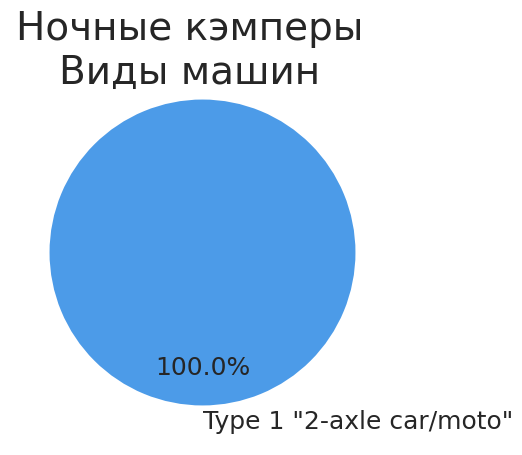

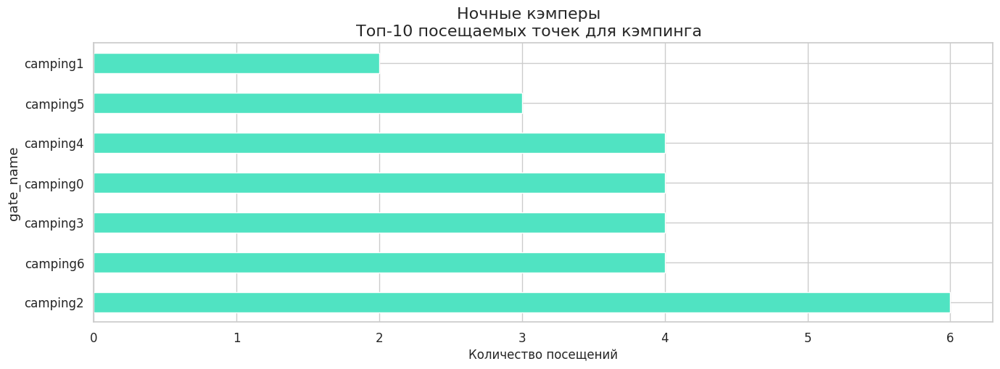

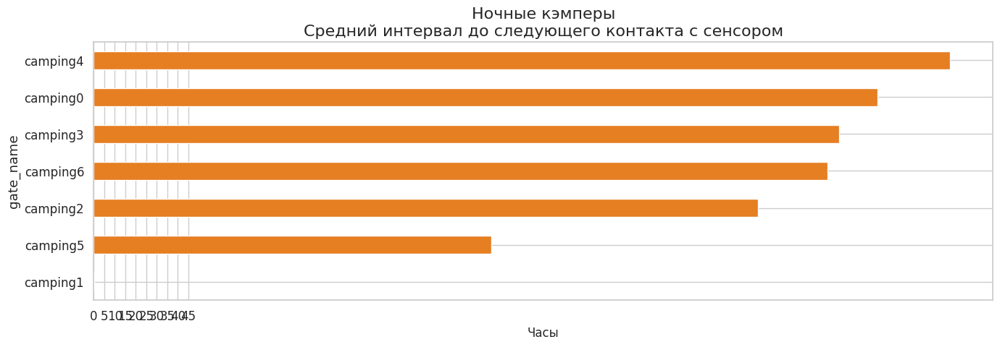

In [114]:
stats["camp_8000"] = (
    (stats["duration_h"] >= 8000) & stats["visited_camping"] & (stats["is_ranger"] != 1)
)
camp_8000 = stats[stats["camp_8000"]]
camp_8000_df = df[df["car_id"].isin(camp_8000.index) & (df["sensor_type"] == "Camping")]

print(f"Enter: {camp_8000_df.iloc[0]["timestamp"]}")
print(f"Leave: {camp_8000_df.iloc[-1]["timestamp"]}")
camp_vehicle_pie(camp_8000)
camp_top_stations_hist(camp_8000_df)
camp_duration_histogram(camp_8000_df)
sankey_by_hypothesis_diagram(df, camp_8000, top_n=1, min_flow=1, visitors="all")

#### 2000 часов ~ почти 3 месяца

Enter: 2015-06-19 14:52:25
Leave: 2015-10-04 23:42:30


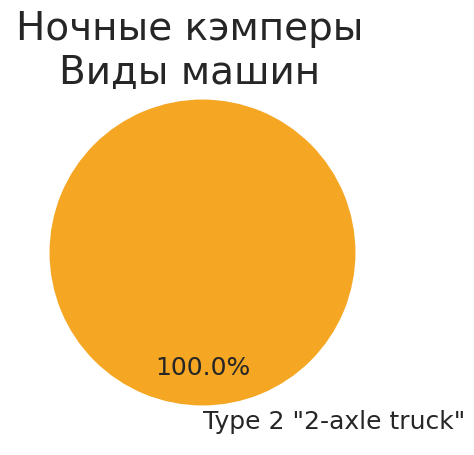

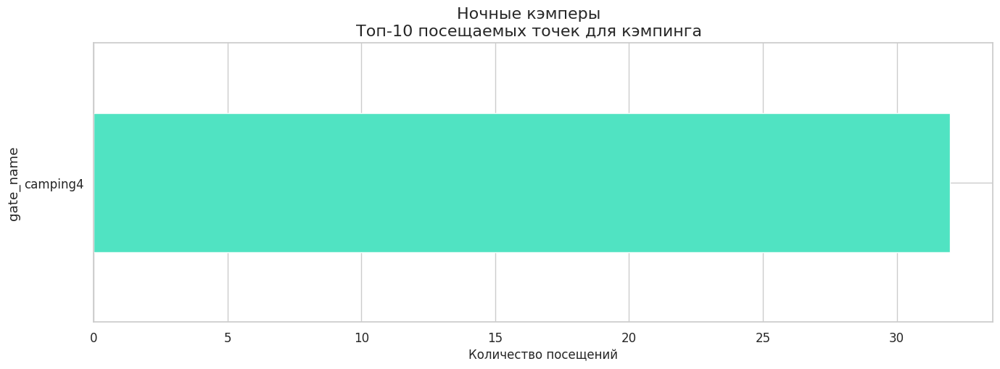

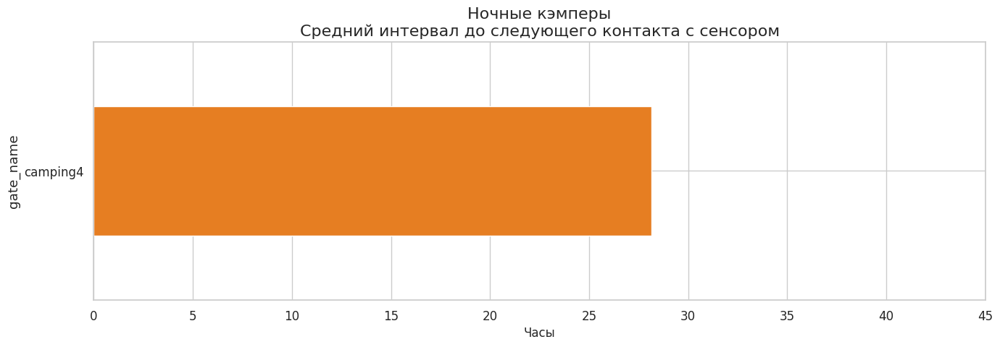

In [115]:
stats["camp_2000"] = (
    (stats["duration_h"] >= 2000) & (stats["duration_h"] < 8000) & stats["visited_camping"] & (stats["is_ranger"] != 1)
)
camp_2000 = stats[stats["camp_2000"]]
camp_2000_df = df[df["car_id"].isin(camp_2000.index) & (df["sensor_type"] == "Camping")]

print(f"Enter: {camp_2000_df.iloc[0]["timestamp"]}")
print(f"Leave: {camp_2000_df.iloc[-1]["timestamp"]}")
camp_vehicle_pie(camp_2000)
camp_top_stations_hist(camp_2000_df)
camp_duration_histogram(camp_2000_df)
sankey_by_hypothesis_diagram(df, camp_2000, top_n=1, min_flow=1, visitors="all")

#### 1000 часов ~ чуть больше месяца

Enter: 2015-06-12 14:11:10
Leave: 2015-07-26 22:30:57


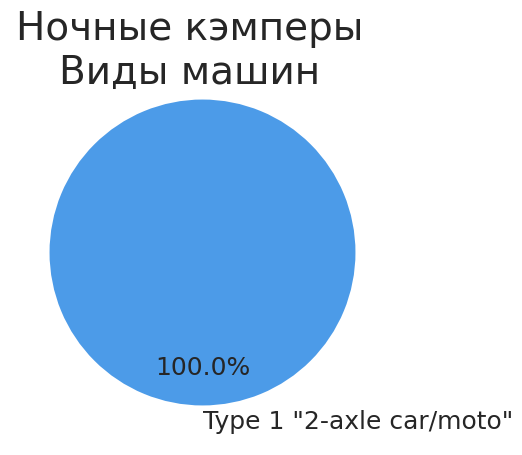

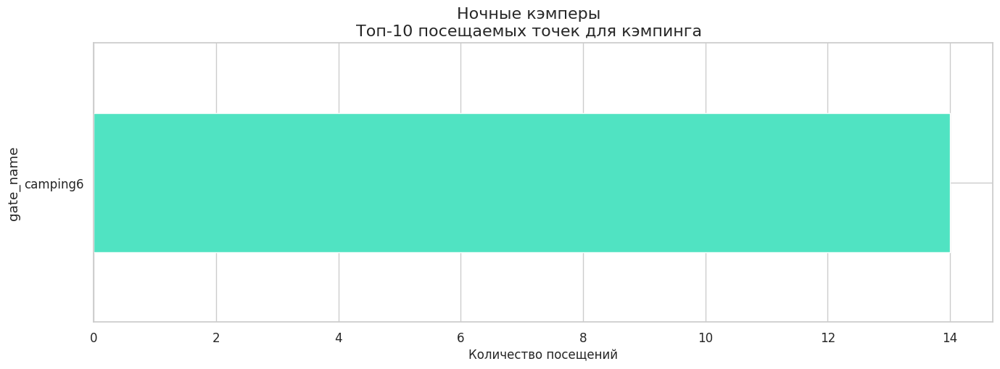

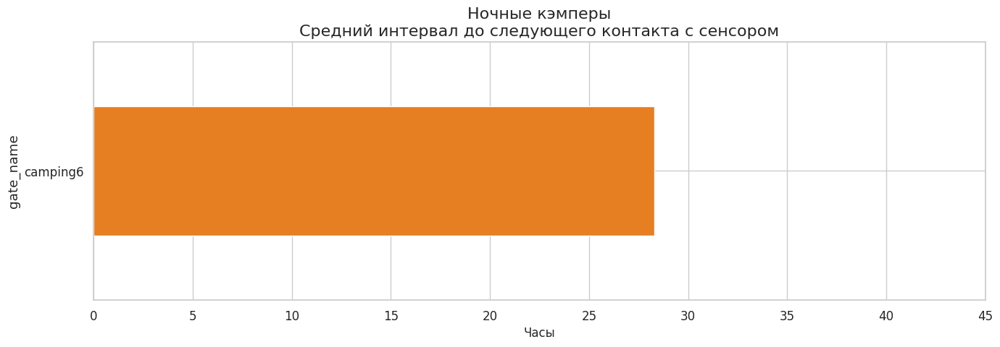

In [116]:
stats["camp_1000"] = (
    (stats["duration_h"] >= 1000) & (stats["duration_h"] < 2000) & stats["visited_camping"] & (stats["is_ranger"] != 1)
)
camp_1000 = stats[stats["camp_1000"]]
camp_1000_df = df[df["car_id"].isin(camp_1000.index) & (df["sensor_type"] == "Camping")]

print(f"Enter: {camp_1000_df.iloc[0]["timestamp"]}")
print(f"Leave: {camp_1000_df.iloc[-1]["timestamp"]}")
camp_vehicle_pie(camp_1000)
camp_top_stations_hist(camp_1000_df)
camp_duration_histogram(camp_1000_df)
sankey_by_hypothesis_diagram(df, camp_1000, top_n=1, min_flow=1, visitors="all")

# Вывод

TODO:
* итоговый вывод дописать когда все будет готово